In [ ]:
from keras.models import load_model
from PIL import Image, ImageOps
import numpy as np

# Load the model
model = load_model('/content/keras_model.h5')

# Create the array of the right shape to feed into the keras model
# The 'length' or number of images you can put into the array is
# determined by the first position in the shape tuple, in this case 1.
data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)
# Replace this with the path to your image
image = Image.open('/content/my_book.jpg')
#resize the image to a 224x224 with the same strategy as in TM2:
#resizing the image to be at least 224x224 and then cropping from the center
size = (224, 224)
image = ImageOps.fit(image, size, Image.ANTIALIAS)

#turn the image into a numpy array
image_array = np.asarray(image)
# Normalize the image
normalized_image_array = (image_array.astype(np.float32) / 127.0) - 1
# Load the image into the array
data[0] = normalized_image_array

# run the inference
prediction = model.predict(data)
print(prediction)


[[5.3391740e-02 9.4568253e-01 9.2570175e-04]]


In [ ]:
# run the inference
prediction = model.predict(data)
print(prediction)

[[5.3391740e-02 9.4568253e-01 9.2570175e-04]]


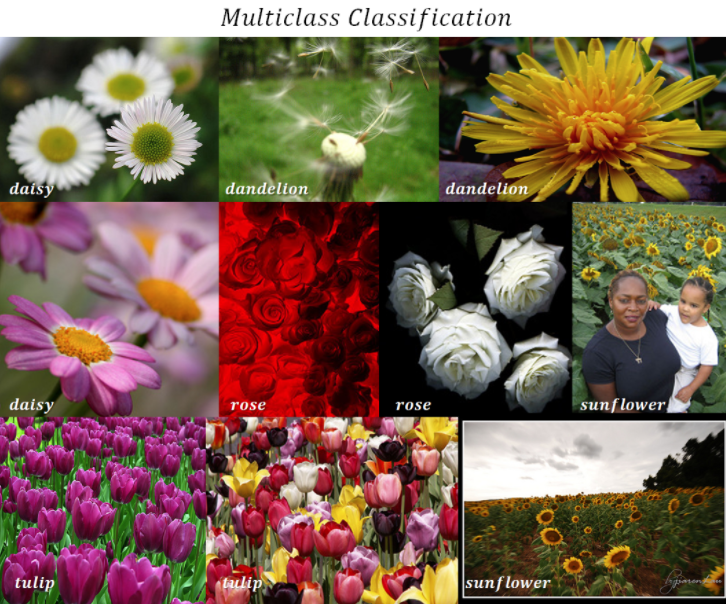

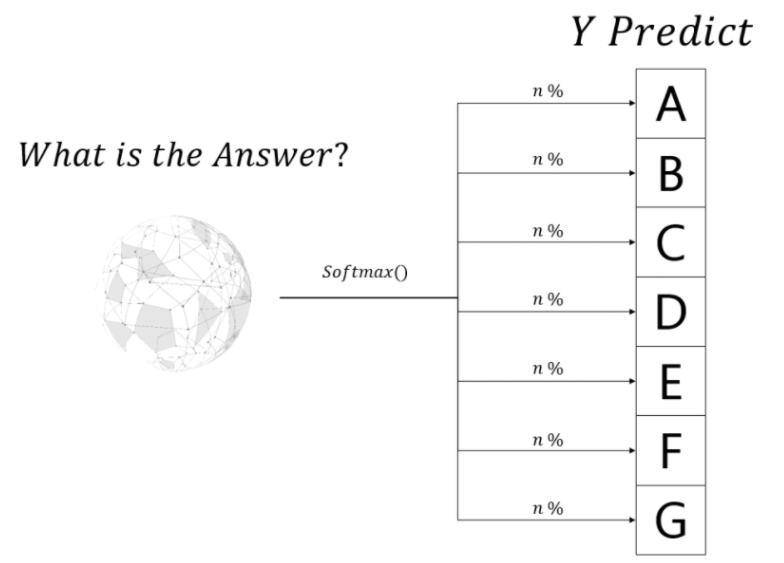

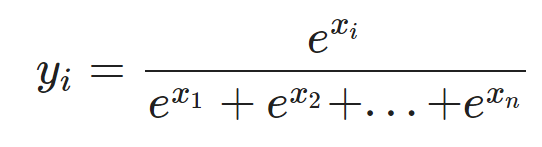

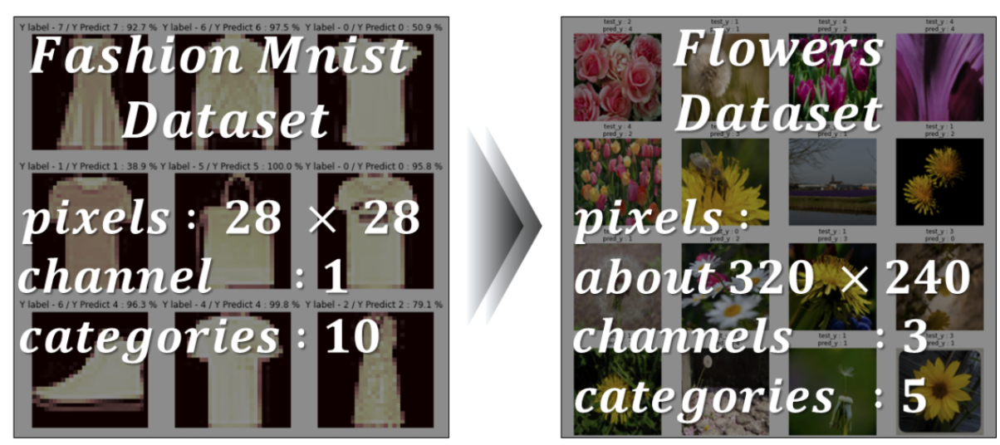

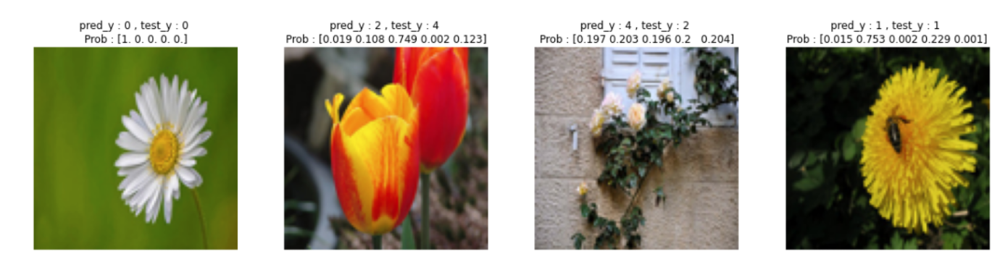

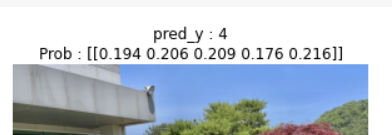

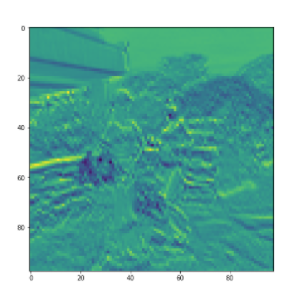

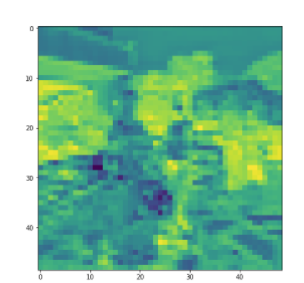

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os

import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
img = Image.open('dataset/flowers/rose/11944957684_2cc806276e.jpg')

In [ ]:
plt.imshow(img)
plt.show()
#plt.draw()

In [ ]:
img_array = np.array(img)
print("img_array.shape : ", img_array.shape)

In [ ]:
resized = img.resize([100,100])

print("resized : ", resized)
plt.imshow(resized)
plt.show()

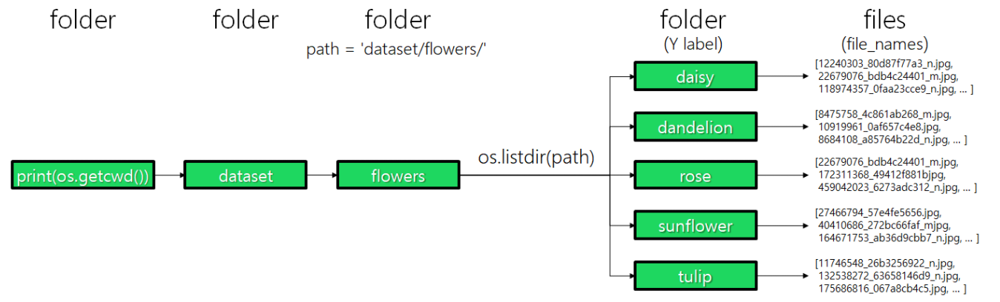

In [ ]:
path = 'dataset/flowers/'

In [ ]:
filenames = os.listdir(path)
print("filenames : ", filenames)

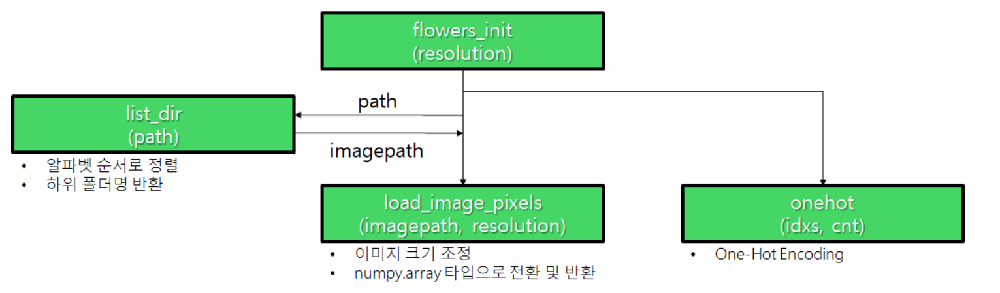

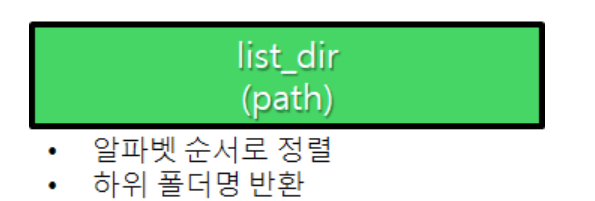

In [ ]:
def list_dir(path):
    filenames = os.listdir(path)
    filenames.sort()
    
    return filenames

In [ ]:
path = 'dataset/flowers/'
target_names = list_dir(path)
print("target_names :", target_names)

In [ ]:
for dx, dname in enumerate(target_names):
    print("dname : ", dname)
    
    subpath = path + dname
    print("subpath : ", subpath)
    
    filenames = list_dir(subpath)
    print("filenames : ", filenames[:3])

In [ ]:
imagepath = os.path.join(subpath, filenames[3])
print("imagepath : ", imagepath)

In [ ]:
img = Image.open(imagepath)
img

In [ ]:
resize = img.resize([100,100])
resize_np_array = np.array(resize)
print(resize_np_array)

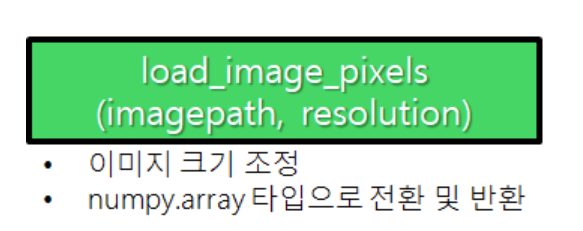

In [ ]:
def load_image_pixels(imagepath, resolution):
    img         = Image.open(imagepath)
    img_resized = img.resize(resolution)
    return np.array(img_resized)

In [ ]:
resolution = [100,100]
pixels = load_image_pixels(imagepath, resolution)
print("pixels : \n",pixels)

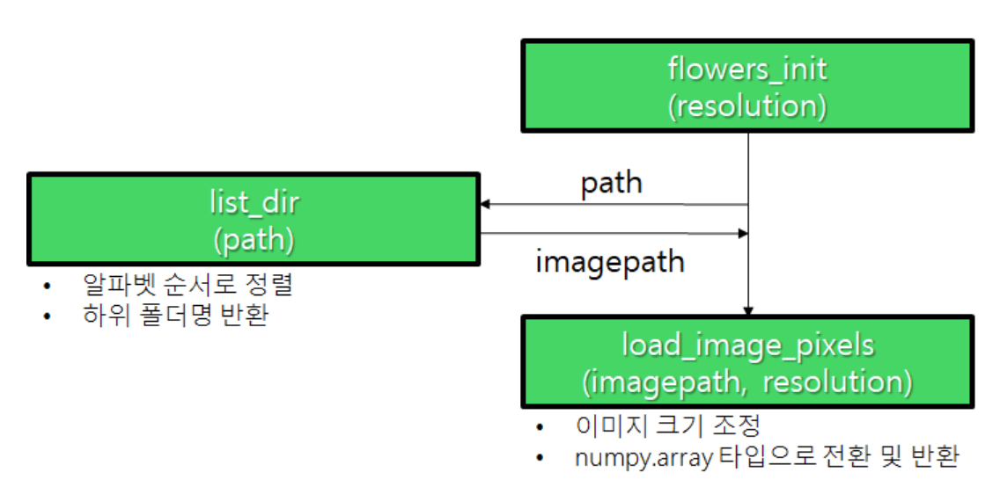

In [ ]:
import os 
os.getcwd()

'/content'

In [ ]:
resolution = [100,100]
def flowers_init(resolution):
    path = '/content/drive/MyDrive/광인사_1기/2rl/flowers/'
    
    target_names = list_dir(path = path)
    
    for dx, dname in enumerate(target_names):
        print("dname : ", dname)
        
        subpath = path + dname
        print("subpath : ",subpath)
        
        filenames = list_dir(subpath)
        print("filenames : ", filenames[:3])
        
        for fname in filenames:
            if fname[-4:] != '.jpg':
                continue
                
            imagepath = os.path.join(subpath, fname)
            
            pixels = load_image_pixels(imagepath, resolution)
            #독립변수를 위한 변수
            images.append(pixels)
            #종속변수를 위한 변수
            idxs.append(dx)
            
    xs = np.asarray(images, dtype=np.float32)
        
        
    return xs, images, idxs
        
        

In [ ]:
xs, images, idxs = flowers_init(resolution = resolution)

In [ ]:
print("idxs[:5] : ", idxs[:5])

In [ ]:
print(pd.DataFrame(idxs).value_counts())

In [ ]:
print("xs[0].shape :" , xs[0].shape)
print("xs.shape :" , xs.shape)


In [ ]:
img = xs[9]
# plt.imshow(img)
# 2의 8승 
256
img_image = Image.fromarray(np.uint8(img))
plt.imshow(img_image)
plt.show()

In [ ]:
img

In [ ]:
np.uint8(img)

In [ ]:
plt.figure(figsize=(15,15))

for i in range(25):
    plt.subplot(5,5,i+1)
    i = np.random.choice(4317)
    
    img = xs[i]
    img_image = Image.fromarray(np.uint8(img))
    plt.axis('off')
    plt.imshow(img_image)
    
plt.show()

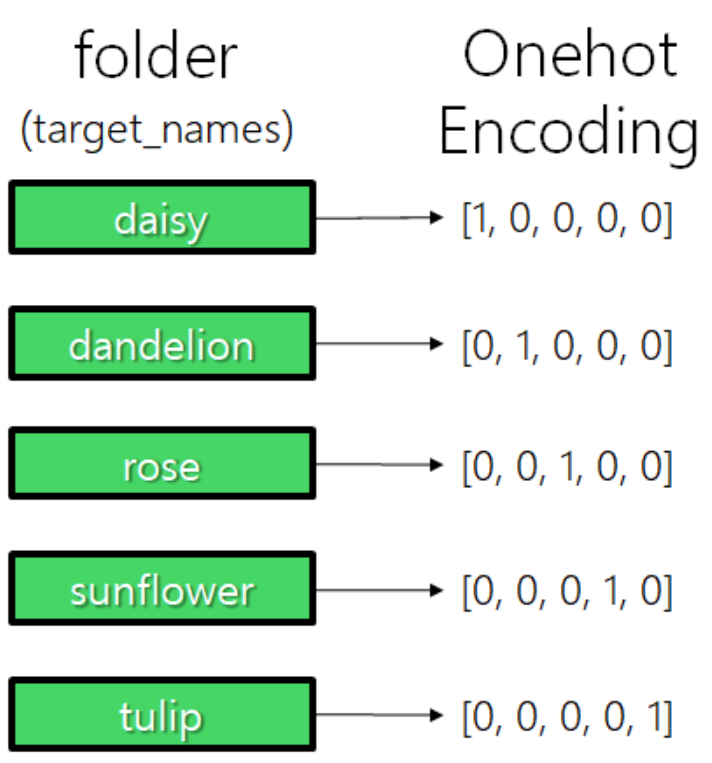

In [ ]:
cnt = 5 
print(np.eye(cnt)[0])
print(np.eye(cnt)[1])
print(np.eye(cnt)[2])

In [ ]:
print(idxs)

In [ ]:
def onehot(idxs, cnt):
    return np.eye(cnt)[idxs]

In [ ]:
cnt = len(target_names)

In [ ]:
ys = onehot(idxs, cnt)

In [ ]:
ys[4000]

In [ ]:
def flowers_init(resolution):
    path = '/content/drive/MyDrive/광인사_1기/2rl/flowers/'
    target_names = list_dir(path)
    
    images,idxs = [], []
    
    for dx, dname in enumerate(target_names):
        print('dname : ', dname)

        subpath = path + dname
        print("subpath : ", subpath)

        filepath = list_dir(subpath)
        print("filepath : ", filepath[:3])
        
        for fname in filepath:
            if fname[-4:] != '.jpg':
                continue
            imagepath = os.path.join(subpath, fname)
            
            pixels = load_image_pixels(imagepath, resolution)
            
            images.append(pixels)
            idxs.append(dx)
            
    xs = np.asarray(images, dtype=np.float32)
    
    ys = onehot(idxs, len(target_names))
    
    return xs, ys

In [ ]:
resolution = [100,100]
xs, ys = flowers_init(resolution)

dname :  daisy
subpath :  /content/drive/MyDrive/광인사_1기/2rl/flowers/daisy
filepath :  ['100080576_f52e8ee070_n.jpg', '10140303196_b88d3d6cec.jpg', '10172379554_b296050f82_n.jpg']
dname :  dandelion
subpath :  /content/drive/MyDrive/광인사_1기/2rl/flowers/dandelion
filepath :  ['10043234166_e6dd915111_n.jpg', '10200780773_c6051a7d71_n.jpg', '10294487385_92a0676c7d_m.jpg']
dname :  rose
subpath :  /content/drive/MyDrive/광인사_1기/2rl/flowers/rose
filepath :  ['10090824183_d02c613f10_m.jpg', '102501987_3cdb8e5394_n.jpg', '10503217854_e66a804309.jpg']
dname :  sunflower
subpath :  /content/drive/MyDrive/광인사_1기/2rl/flowers/sunflower
filepath :  ['1008566138_6927679c8a.jpg', '1022552002_2b93faf9e7_n.jpg', '1022552036_67d33d5bd8_n.jpg']
dname :  tulip
subpath :  /content/drive/MyDrive/광인사_1기/2rl/flowers/tulip
filepath :  ['100930342_92e8746431_n.jpg', '10094729603_eeca3f2cb6.jpg', '10094731133_94a942463c.jpg']


In [ ]:
print("xs.shape : ", xs.shape)
print("ys.shape : ", ys.shape)

xs.shape :  (4317, 100, 100, 3)
ys.shape :  (4317, 5)


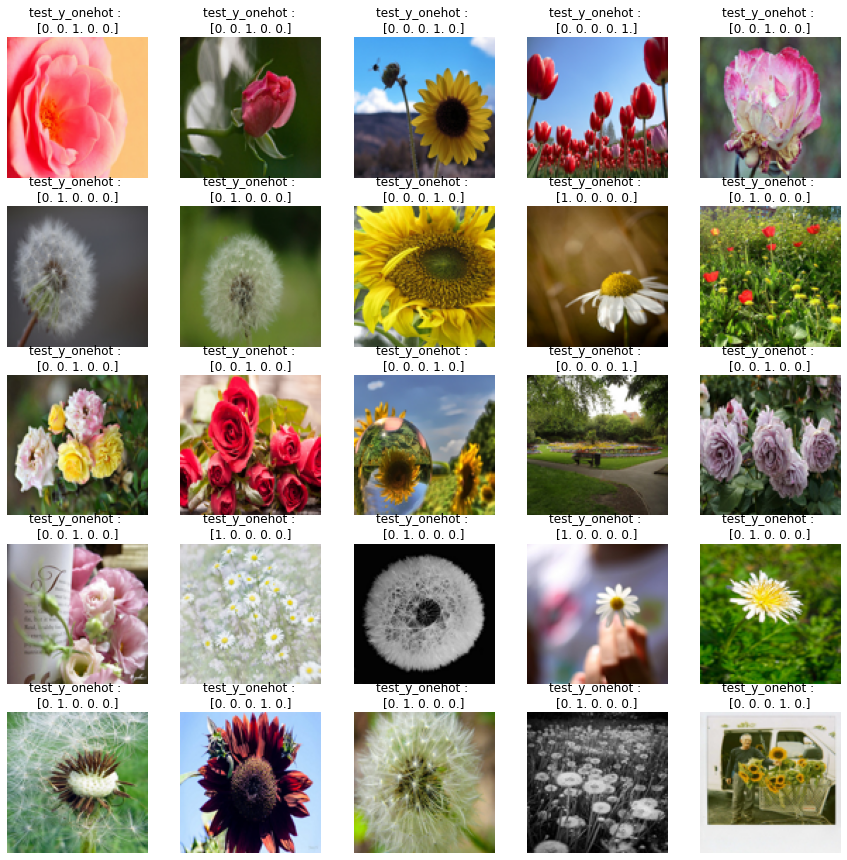

In [ ]:
plt.figure(figsize=(15,15))

for i in range(25):
    plt.subplot(5,5,i+1)
    i = np.random.choice(4317)
    
    img = xs[i]
    img_image = Image.fromarray(np.uint8(img))
    
    plt.title('test_y_onehot : \n{}'.format(ys[i]))
    plt.axis('off')
    plt.imshow(img_image)
    
plt.show()

In [ ]:
print(xs.min())
print(xs.max())

0.0
255.0


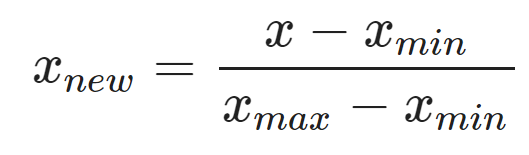

In [ ]:
xs_norm = xs / 255.0

print("xs_norm.min() : ", xs_norm.min())
print("xs_norm.max() : ", xs_norm.max())

xs_norm.min() :  0.0
xs_norm.max() :  1.0


In [ ]:
shuffle_map = np.arange(xs_norm.shape[0])
np.random.shuffle(shuffle_map)

print(len(shuffle_map))
print(shuffle_map)

4317
[2837 2075 4257 ... 1675 4306 2143]


In [ ]:
train_ratio = 0.8

test_begin_index = int(xs_norm.shape[0] * train_ratio)
print("test_begin_index : ", test_begin_index)

test_begin_index :  3453


In [ ]:
train_x = xs_norm[shuffle_map[:test_begin_index]]
train_y = xs_norm[shuffle_map[:test_begin_index]]

test_x  = xs[shuffle_map[test_begin_index:]]
test_y  = ys[shuffle_map[test_begin_index:]]

In [ ]:
print("train_x.shape : ", train_x.shape)
print("train_y.shape : ", train_y.shape)
print("test_x.shape : ", test_x.shape)
print("test_y.shape : ", test_y.shape)

train_x.shape :  (3453, 100, 100, 3)
train_y.shape :  (3453, 5)
test_x.shape :  (864, 100, 100, 3)
test_y.shape :  (864, 5)


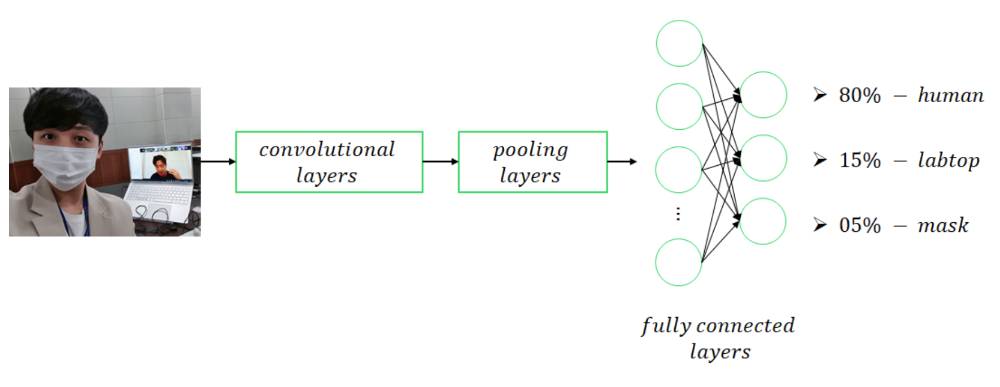

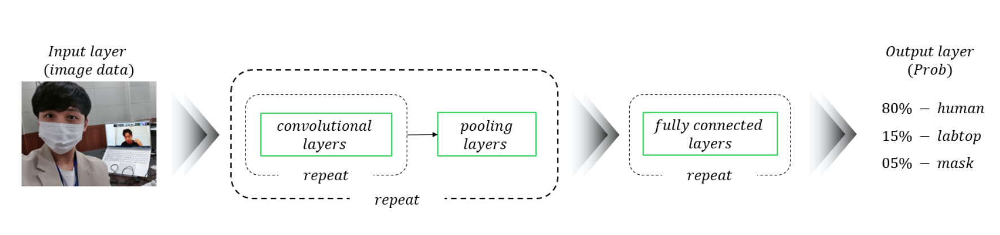

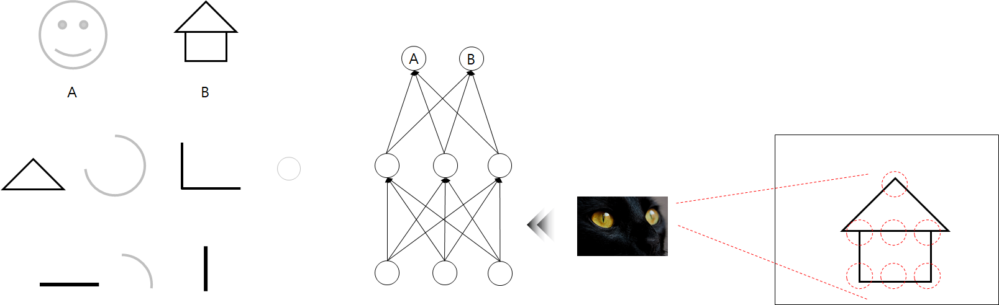

In [ ]:
model_0 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(input_shape=(100,100,3),kernel_size=(3,3),
    filters=16, strides = (1,1),padding = 'valid'),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=32),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=64),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128, activation = 'relu'),
    tf.keras.layers.Dense(units=5, activation = 'softmax')
])

In [ ]:
model_0.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 16)        448       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 32)        4640      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 94, 94, 64)        18496     
_________________________________________________________________
flatten (Flatten)            (None, 565504)            0         
_________________________________________________________________
dense (Dense)                (None, 128)               72384640  
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 645       
Total params: 72,408,869
Trainable params: 72,408,869
Non-trainable params: 0
____________________________________________

In [ ]:
model_1 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(input_shape=(100,100,3),kernel_size=(3,3),filters=32),
    tf.keras.layers.MaxPool2D(strides = (2,2),pool_size=(2,2)),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters = 64),
    tf.keras.layers.AvgPool2D(strides = (2,2)),
    tf.keras.layers.Conv2D(kernel_size=(3,3),filters=128),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128, activation = 'relu'),
    tf.keras.layers.Dropout(rate = 0.3),
    tf.keras.layers.Dense(units=5, activation = 'softmax')
])

In [ ]:
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 47, 47, 64)        18496     
_________________________________________________________________
average_pooling2d (AveragePo (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 21, 21, 128)       73856     
_________________________________________________________________
flatten_1 (Flatten)          (None, 56448)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)              

# VGGNet

In [ ]:
model_2 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(input_shape=(100,100,3),kernel_size=(3,3),filters=32,padding='same',activation='relu'),
    tf.keras.layers.Conv2D(input_shape=(100,100,32),kernel_size=(3,3),filters=64,padding='same',activation='relu'),
    tf.keras.layers.MaxPool2D(strides = (2,2)),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Conv2D(kernel_size=(3,3), filters = 128, padding = 'same', activation='relu'),
    tf.keras.layers.Conv2D(kernel_size=(3,3), filters = 256, padding = 'valid', activation='relu'),
    tf.keras.layers.MaxPool2D(strides = (2,2),),
    tf.keras.layers.Dropout(rate=0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512, activation = 'relu'),
    tf.keras.layers.Dropout(rate = 0.5),
    tf.keras.layers.Dense(units=256, activation = 'relu'),
    tf.keras.layers.Dropout(rate = 0.5),
    tf.keras.layers.Dense(units=5, activation = 'softmax')
])


In [ ]:
model_2.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 100, 100, 32)      896       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 100, 100, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 50, 50, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 50, 50, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 50, 50, 128)       73856     
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 48, 48, 256)       295168    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 24, 24, 256)      

# GPT - 3 -> 1억? 10억? 파라미터 

In [ ]:
model_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
                loss = 'categorical_crossentropy',
                metrics = [tf.keras.metrics.TruePositives(name = 'TP'),
                           tf.keras.metrics.FalsePositives(name = 'FP')])

In [ ]:
history = model_1.fit(train_x, train_y,
                      epochs = 50,
                      batch_size = 32,
                      validation_split = 0.2)

In [ ]:
model_1 = tf.keras.models.load_model('save_model/flowers_model_1.h5')

In [ ]:
model_1.evaluate(test_x,test_y)

In [ ]:
pred_y = model_1.predict(test_x)

In [ ]:
test_index = 20

print("Pred_Y_{} -> {}".format(test_index, np.argmax(pred_y[test_index])))
print("Test_Y_{} -> {}".format(test_index, np.argmax(test_y[test_index])))

print("Pred_Y_Prob : ", np.round(pred_y[test_index],3))

img       = test_x[test_index]
img_image = Image.fromarray(np.uint8(img))

plt.imshow(img_image)
plt.axis('off')
plt.show()

In [ ]:
plt.figure(figsize=(20,20))

for i in range(16):
    
    plt.subplot(4,4,i+1)
    
    i = np.random.choice(864)
    img = test_x[i]
    img_Image = Image.fromarray(np.uint8(img))
    plt.imshow(img_Image)
    
    plt.title('pred_y : {} , test_y : {} \nProb : {}'.format(np.argmax(pred_y[i]), np.argmax(test_y[i]), np.round(pred_y[i],3)))
    plt.axis('off')

plt.draw()

#plt.show()

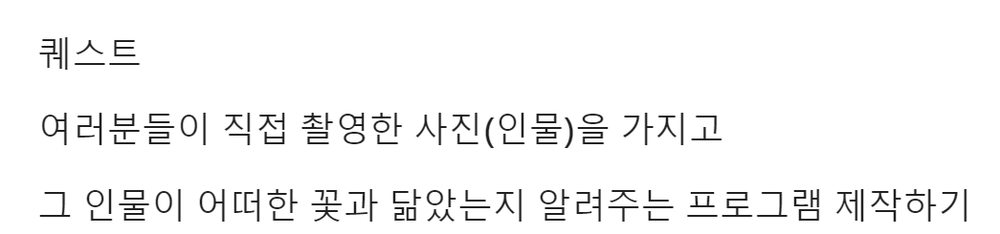

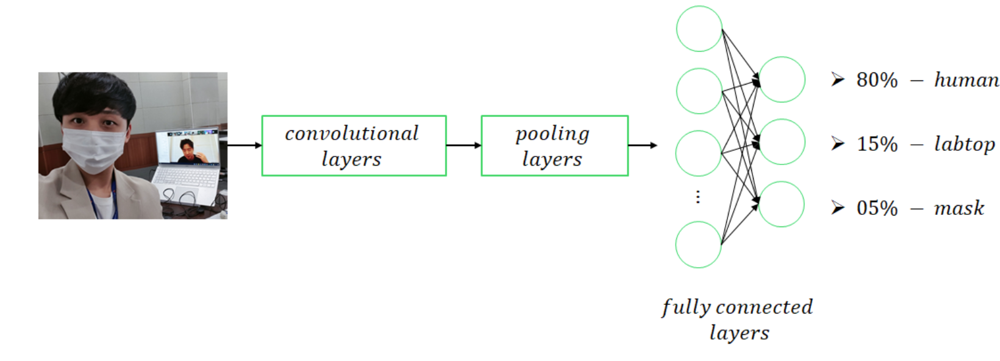

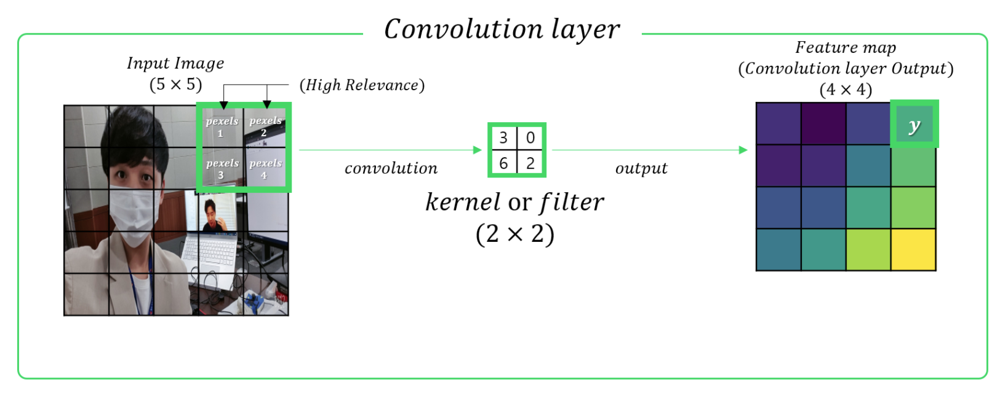

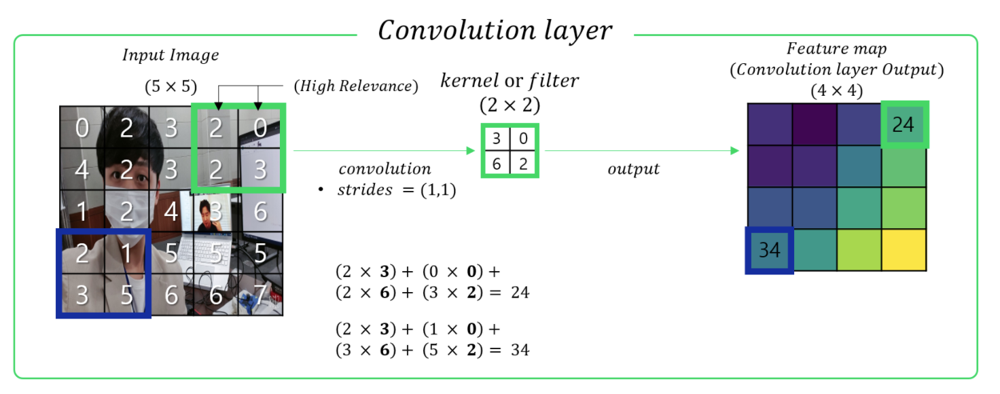

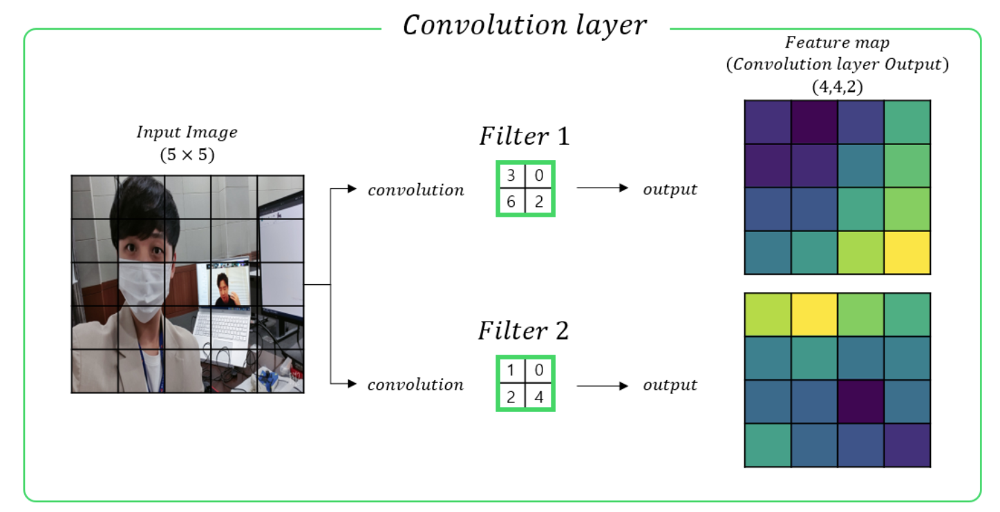

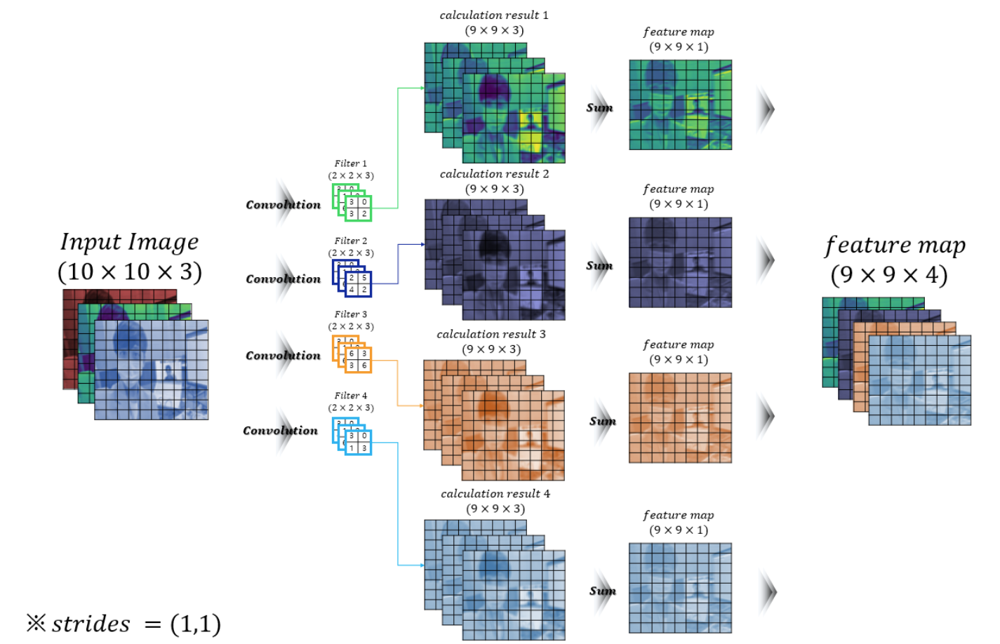

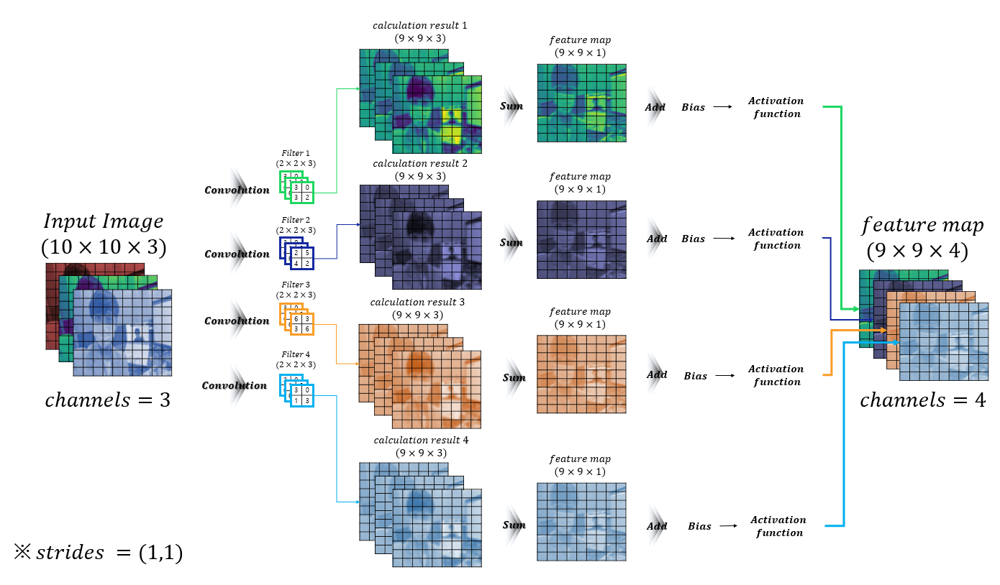

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from tensorflow.keras.models import Model

In [ ]:
model_1 = tf.keras.models.load_model('/content/drive/MyDrive/광인사_1기/2rl/dataset/flowers_model_1.h5')

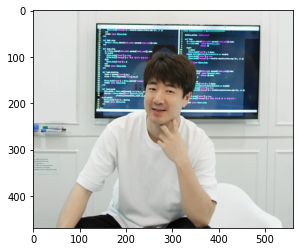

In [ ]:
img = Image.open('/content/test.jpg')
plt.imshow(img)

In [ ]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 64)        18496     
_________________________________________________________________
average_pooling2d (AveragePo (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 21, 21, 128)       73856     
_________________________________________________________________
flatten (Flatten)            (None, 56448)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               7

In [ ]:
# 첫 번째 계층 통과(합성곱)
ins  = model_1.inputs
outs = model_1.layers[0].output

feature_map = Model(inputs = ins, outputs = outs)
feature_map.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_input (InputLayer)    [(None, 100, 100, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 98, 98, 32)        896       
Total params: 896
Trainable params: 896
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 두 번째 계층 통과(풀링)
ins  = model_1.inputs
outs = model_1.layers[1].output

feature_map = Model(inputs = ins, outputs = outs)
feature_map.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_input (InputLayer)    [(None, 100, 100, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
Total params: 896
Trainable params: 896
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 다 번째 계층 통과(합성곱)
ins  = model_1.inputs
outs = model_1.layers[4].output

feature_map = Model(inputs = ins, outputs = outs)
feature_map.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_input (InputLayer)    [(None, 100, 100, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 64)        18496     
_________________________________________________________________
average_pooling2d (AveragePo (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 21, 21, 128)       73856     
Total params: 93,248
Trainable params: 93,248
Non-trainable params: 0
_______________________________________________________

In [ ]:
img_resize = img.resize([100,100])

input_img = np.expand_dims(img_resize, axis = 0)
print("input_img.shape : ", input_img.shape)

input_img.shape :  (1, 100, 100, 3)


In [ ]:
# 첫 번째 계층 통과 결과값(합성곱)
feature = feature_map.predict(input_img)
print("feature.shape : ", feature.shape)

feature.shape :  (1, 98, 98, 32)


In [ ]:
# 두 번째 계층 통과 결과값(풀링)
feature = feature_map.predict(input_img)
print("feature.shape : ", feature.shape)

feature.shape :  (1, 49, 49, 32)


In [ ]:
# 마지막 합성곱 계층 통과 결과값(합성곱)
feature = feature_map.predict(input_img)
print("feature.shape : ", feature.shape)

feature.shape :  (1, 21, 21, 128)


In [ ]:
# 첫 번째 계층 통과 시각화 (합성곱)
fig = plt.figure(figsize= (50,50))

for i in range(32):
    ax = fig.add_subplot(6,6,i+1)
    ax.imshow(feature[0 , :, :, i])

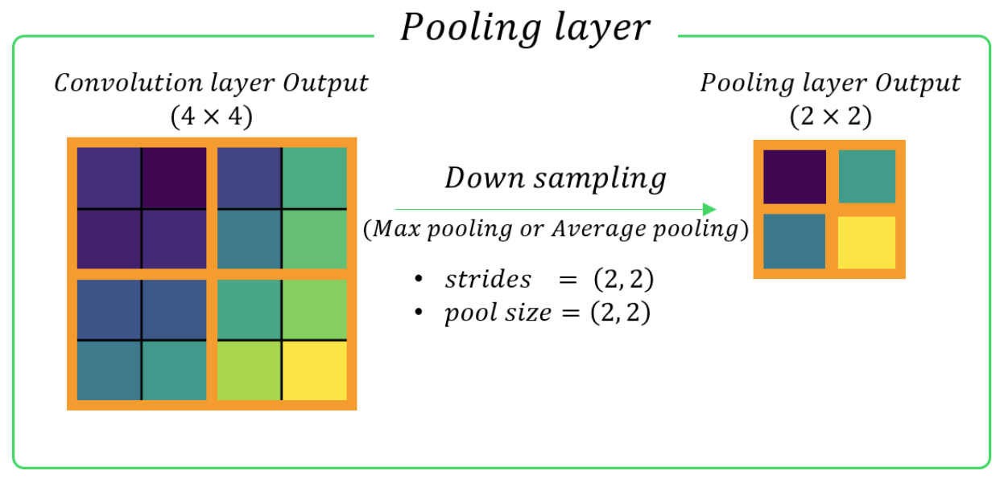

In [ ]:
# 두 번째 계층 통과 시각화 (풀링)
fig = plt.figure(figsize= (50,50))

for i in range(32):
    ax = fig.add_subplot(6,6,i+1)
    ax.imshow(feature[0 , :, :, i])

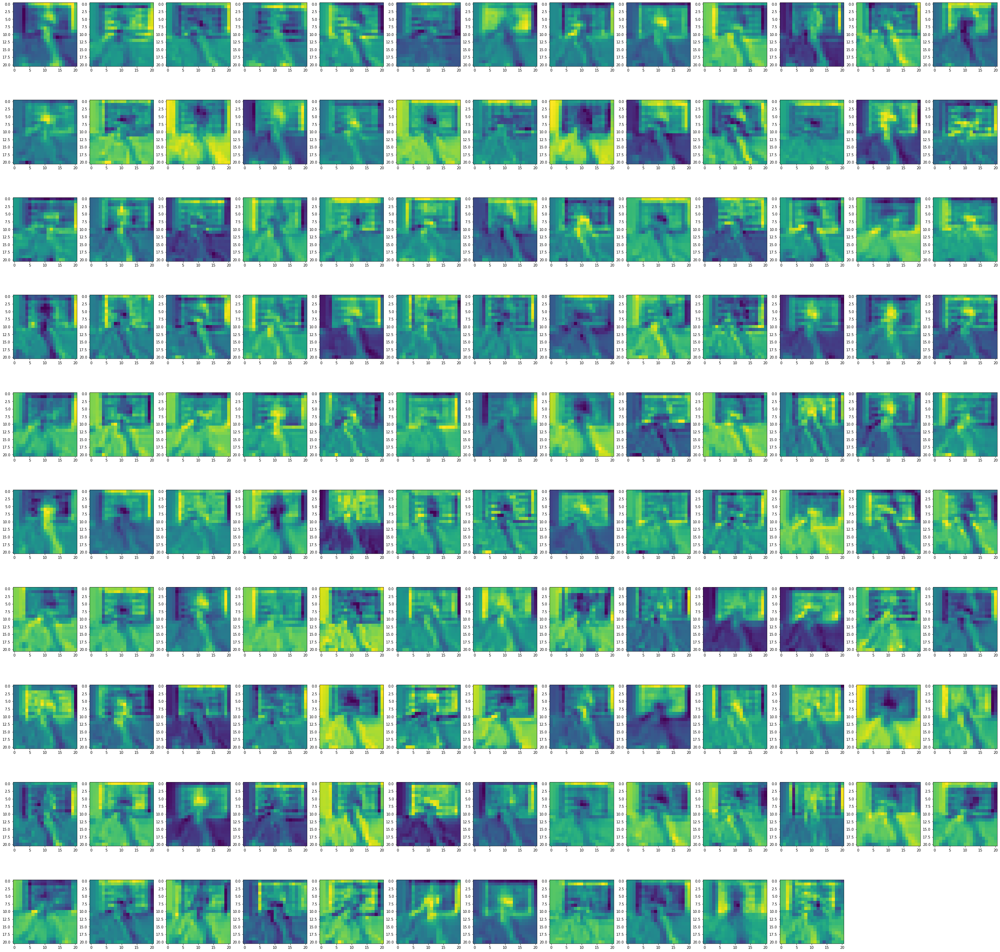

In [ ]:
# 마지막 합성곱 계층 통과 시각화
fig = plt.figure(figsize= (50,50))

for i in range(128):
    ax = fig.add_subplot(10,13,i+1)
    ax.imshow(feature[0 , :, :, i])

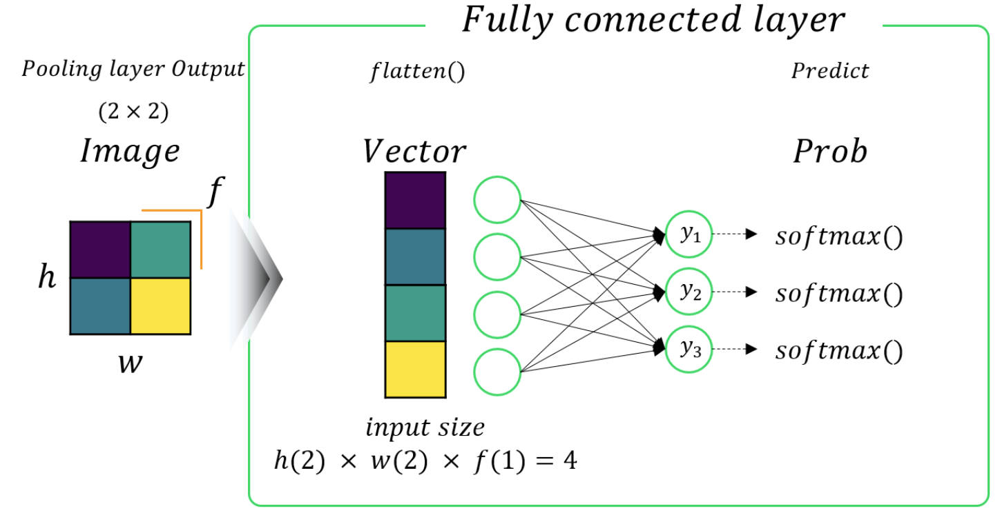

In [ ]:
h = 21
w = 21
f = 128
print("input_size = ", h * w * f)

input_size =  56448


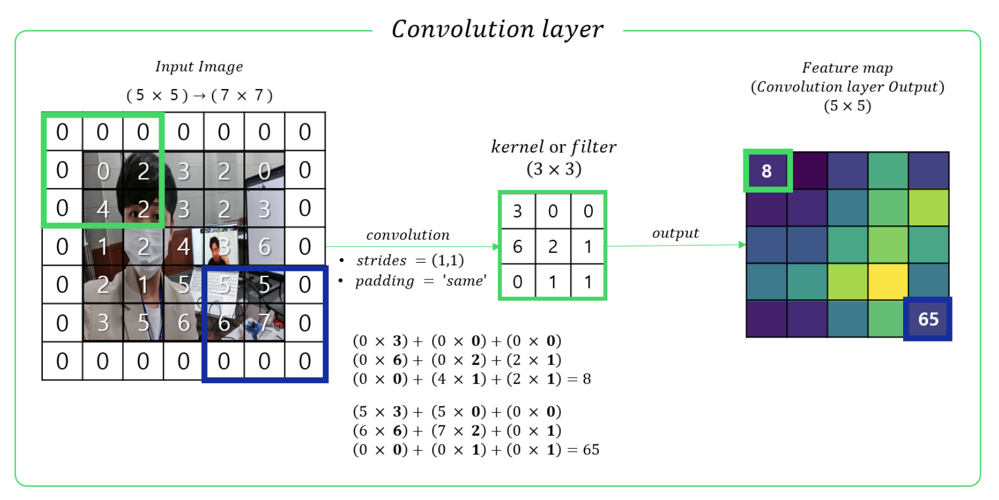

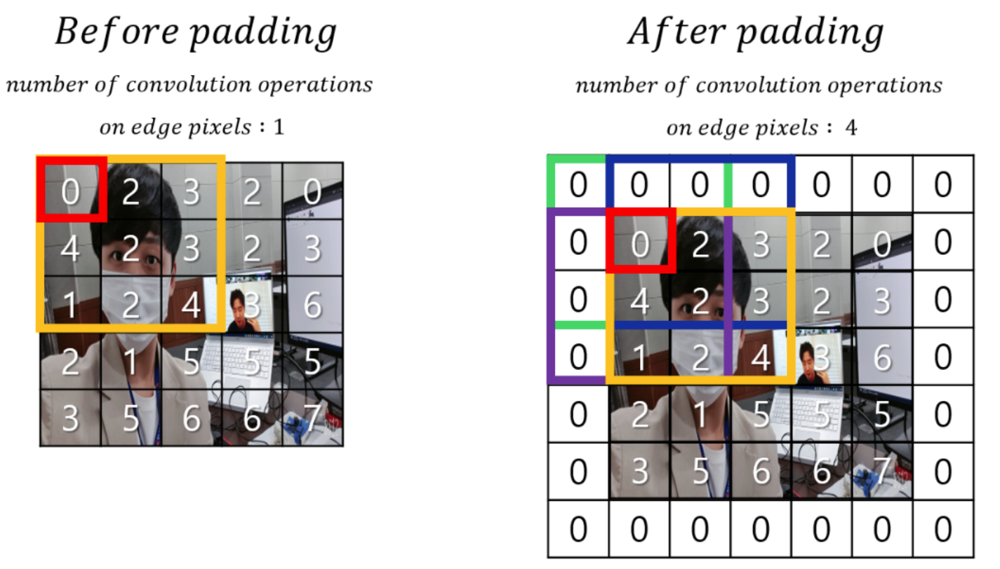